<center>
Using SAM and CLIP to segment a specific object. <br>
Anna Borisiuk
</center>

Run it on Colab GPU T4

In [1]:
import os
import gdown
import zipfile
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2

%matplotlib inline

## Load Data

In [2]:
def download_and_extract_data():
    url = "https://drive.google.com/uc?id=1hcGkpo39lp6PuinYJctipuCedJuoLxrz"
    output = "scannet_dataset.zip"

    gdown.download(url, output, quiet=False)

    with zipfile.ZipFile(output, 'r') as zip_ref:
        zip_ref.extractall("scannet_dataset")

In [3]:
download_and_extract_data()

Downloading...
From (original): https://drive.google.com/uc?id=1hcGkpo39lp6PuinYJctipuCedJuoLxrz
From (redirected): https://drive.google.com/uc?id=1hcGkpo39lp6PuinYJctipuCedJuoLxrz&confirm=t&uuid=3482c133-e526-467c-be1e-0426803e058e
To: /content/scannet_dataset.zip
100%|██████████| 170M/170M [00:06<00:00, 27.7MB/s]


## Data Visualisation and Dataset cutting

In [4]:
# Function to load and display the image and its mask
def display_image_and_mask(image_path, mask_path):
    image = Image.open(image_path)
    mask = Image.open(mask_path)
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    # Display the image
    axes[0].imshow(image)
    axes[0].set_title("Image")
    axes[0].axis('off')

    # Display the mask
    axes[1].imshow(mask)
    axes[1].set_title("Mask")
    axes[1].axis('off')

    plt.show()

# Function to iterate over a set of images and masks and display them
def display_images_and_masks(images_path, masks_path, num_samples=5):
    # Get a list of all image and mask files
    image_files = sorted(os.listdir(images_path))
    mask_files = sorted(os.listdir(masks_path))

    skipped_i = 0
    skip_factor = 6
    if num_samples > len(image_files)//skip_factor:
        num_samples = len(image_files)//skip_factor

    # Limit the number of samples to display
    for i in range(min(num_samples, len(image_files))):
        image_file = image_files[skipped_i]
        mask_file = mask_files[skipped_i]

        # Construct the full path to the image and mask
        image_path = os.path.join(images_path, image_file)
        mask_path = os.path.join(masks_path, mask_file)

        # Display the image and mask
        display_image_and_mask(image_path, mask_path)
        skipped_i += skip_factor

To reduce the computational requirements take every 10th image(that would give 34 images in total)

In [5]:
import shutil

# Paths to the original images, masks, and mask numpy files
images_path = "/content/scannet_dataset/images_0a7cc"
masks_path = "/content/scannet_dataset/gt_semantic_2d/render_semantic"
masks_npy_path = "/content/scannet_dataset/gt_semantic_2d/render_semantic_npy"

# Paths for the new dataset
new_images_path = "/content/cutted_scannet_dataset/images"
new_masks_path = "/content/cutted_scannet_dataset/masks"
new_masks_npy_path = "/content/cutted_scannet_dataset/masks_npy"

# Create the new directories if they do not exist
os.makedirs(new_images_path, exist_ok=True)
os.makedirs(new_masks_path, exist_ok=True)
os.makedirs(new_masks_npy_path, exist_ok=True)

# Get a list of all image, mask, and mask .npy files
image_files = sorted(os.listdir(images_path))
mask_files = sorted(os.listdir(masks_path))
mask_npy_files = sorted(os.listdir(masks_npy_path))

# Select every 10th image (i.e., 0th, 10th, 20th, 30th, etc.)
indices_to_select = range(0, len(image_files), 10)

# Copy the selected files to the new directories
for i in indices_to_select:
    image_file = image_files[i]
    mask_file = mask_files[i]
    mask_npy_file = mask_npy_files[i]

    # Construct the full path to the files
    image_source_path = os.path.join(images_path, image_file)
    mask_source_path = os.path.join(masks_path, mask_file)
    mask_npy_source_path = os.path.join(masks_npy_path, mask_npy_file)

    # Copy the files to the new directories
    shutil.copy(image_source_path, os.path.join(new_images_path, image_file))
    shutil.copy(mask_source_path, os.path.join(new_masks_path, mask_file))
    shutil.copy(mask_npy_source_path, os.path.join(new_masks_npy_path, mask_npy_file))

print(f"Processed {len(indices_to_select)} images, masks, and masks_npy files.")

Processed 35 images, masks, and masks_npy files.


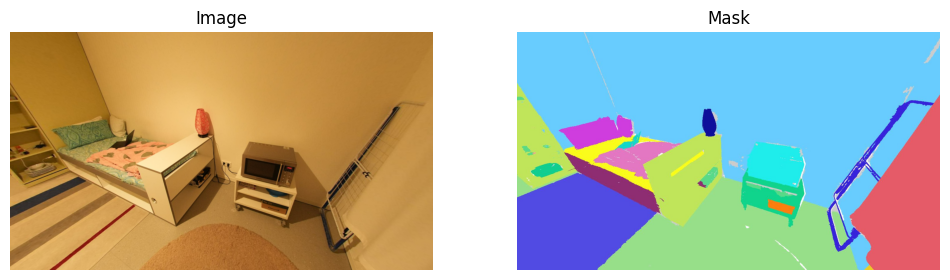

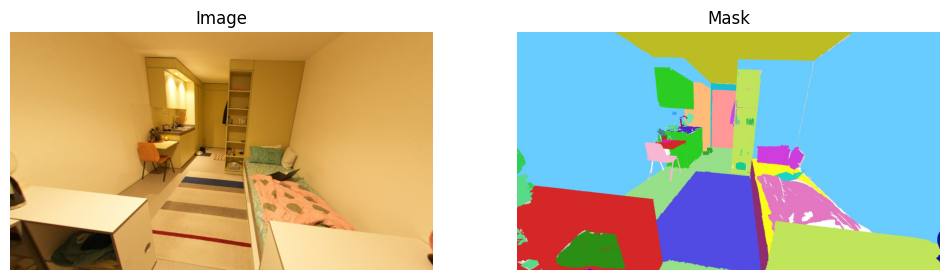

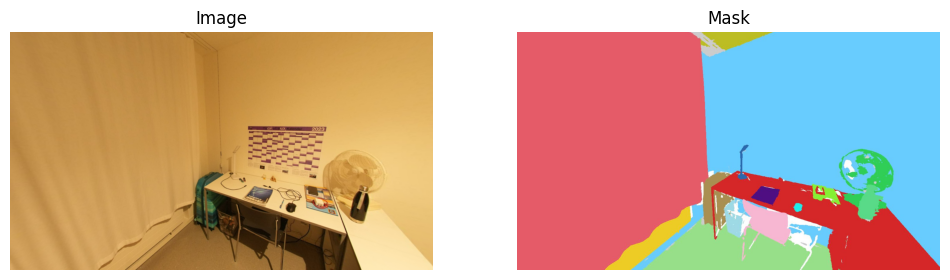

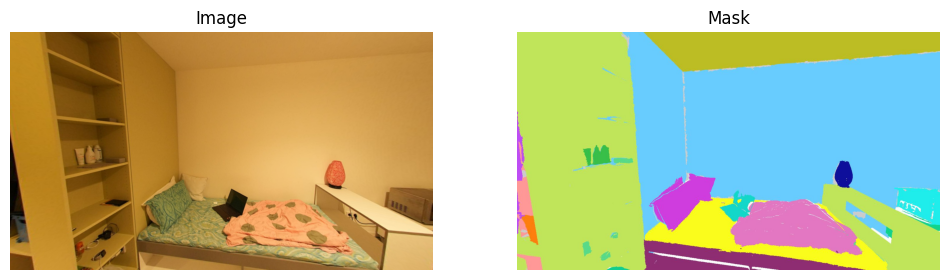

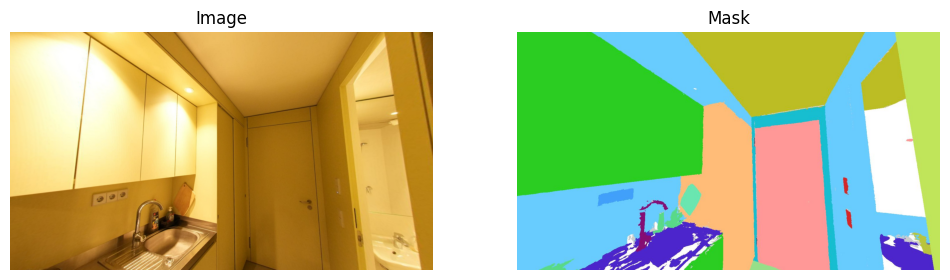

In [6]:
# Display the first 5 images and masks
display_images_and_masks(new_images_path, new_masks_path, num_samples=5)

Let's look at the contents of the mask file and find the "chair" class. Сlass 'Chair' is 8th in mask folder:

In [7]:
npy_file_path = '/content/scannet_dataset/gt_semantic_2d/render_semantic_npy/DSC05846.npy'

data = np.load(npy_file_path)

print(f"Data type: {type(data)}")
print(f"Shape of data: {data.shape}") # H x W: W, H = image.size

print(data)

npy_file_path = '/content/scannet_dataset/gt_semantic_2d/render_semantic_npy/DSC06186.npy'

# Count how many times the value 8 appears in the data
count_8 = np.count_nonzero(data == 8)
print(f"Number of 8's in the file: {count_8}")

Data type: <class 'numpy.ndarray'>
Shape of data: (811, 1440)
[[ 0  0  0 ...  0  0  0]
 [ 0  0  0 ...  0  0  0]
 [ 0  0  0 ...  0  0  0]
 ...
 [19 19 19 ...  0  0  0]
 [19 19 19 ...  0  0  0]
 [19 19 19 ...  0  0  0]]
Number of 8's in the file: 7636


In [8]:
# Define paths
new_images_path = "/content/cutted_scannet_dataset/images"
masks_npy_path = "/content/cutted_scannet_dataset/masks_npy"
output_masks_path = "/content/cutted_scannet_dataset/output_masks"
os.makedirs(output_masks_path, exist_ok=True)

## SAM installation

In [9]:
using_colab = True

if using_colab:
    import torch
    import torchvision
    print("PyTorch version:", torch.__version__)
    print("Torchvision version:", torchvision.__version__)
    print("CUDA is available:", torch.cuda.is_available())
    import sys
    !{sys.executable} -m pip install opencv-python matplotlib
    !{sys.executable} -m pip install 'git+https://github.com/facebookresearch/segment-anything.git'

    !mkdir images
    !wget -P images https://raw.githubusercontent.com/facebookresearch/segment-anything/main/notebooks/images/dog.jpg

    !wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

PyTorch version: 2.5.1+cu121
Torchvision version: 0.20.1+cu121
CUDA is available: True
  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-ir5gcvo4
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-ir5gcvo4
  Resolved https://github.com/facebookresearch/segment-anything.git to commit dca509fe793f601edb92606367a655c15ac00fdf
  Preparing metadata (setup.py) ... done
  Created wheel for segment_anything: filename=segment_anything-1.0-py3-none-any.whl size=36592 sha256=5683f92aec71628397aa1d30839e532090e9ff6f37f6deef29d2a27ae793cd28
  Stored in directory: /tmp/pip-ephem-wheel-cache-hca7ohie/wheels/10/cf/59/9ccb2f0a1bcc81d4fbd0e501680b5d088d690c6cfbc02dc99d
Successfully built segment_anything
--2024-12-06 18:05:18--  https://raw.githubusercontent.com/facebookresearch/segment-anything/main/notebooks/images/dog.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com

Mask generation from SAM returns a list over masks, where each mask is a dictionary containing various data about the mask. These keys are:
* `segmentation` : the mask
* `area` : the area of the mask in pixels
* `bbox` : the boundary box of the mask in XYWH format
* `predicted_iou` : the model's own prediction for the quality of the mask
* `point_coords` : the sampled input point that generated this mask
* `stability_score` : an additional measure of mask quality
* `crop_box` : the crop of the image used to generate this mask in XYWH format

In [10]:
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator

sam_checkpoint = "/content/sam_vit_h_4b8939.pth"
model_type = "vit_h"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
device = "cuda" if torch.cuda.is_available() else "cpu"
sam.to(device=device)

mask_generator = SamAutomaticMaskGenerator(sam)

/usr/local/lib/python3.10/dist-packages/segment_anything/build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(f)


## Clip installation

In [11]:
# $ conda install --yes -c pytorch pytorch=1.7.1 torchvision cudatoolkit=11.0
!pip install ftfy regex tqdm
!pip install git+https://github.com/openai/CLIP.git

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 3.2 MB/s eta 0:00:00
  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-f1_ff413
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-f1_ff413
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done
  Created wheel for clip: filename=clip-1.0-py3-none-any.whl size=1369489 sha256=bf1d98d80ae0df9b4810c8f971c336b8355a6246b802064d66d70e5840221d84
  Stored in directory: /tmp/pip-ephem-wheel-cache-hm2pg8a6/wheels/da/2b/4c/d6691fa9597aac8bb85d2ac13b112deb897d5b50f5ad9a37e4
Successfully built clip


In [12]:
import torch
import clip
from PIL import Image

# Load CLIP model
model, preprocess = clip.load("ViT-B/32", device=device)

100%|███████████████████████████████████████| 338M/338M [00:05<00:00, 61.1MiB/s]


Processing image: /content/cutted_scannet_dataset/images/DSC05947.JPG
Found 40 masks.
Mask suitable for 'chair' with similarity 0.328


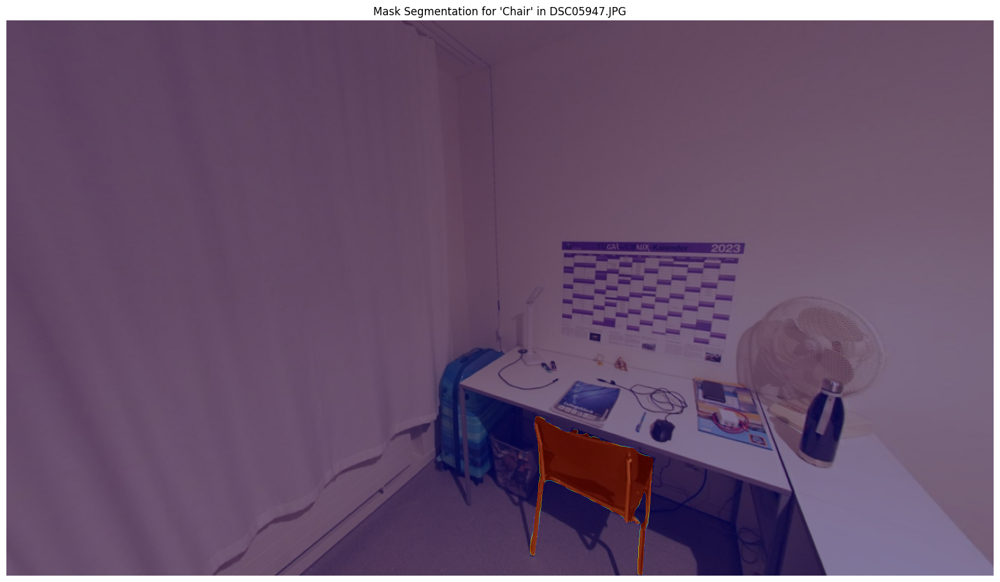

In [13]:
import os
import cv2
import numpy as np
import torch
from PIL import Image
import matplotlib.pyplot as plt

# Function to display masks on an image
def show_anns(anns, image):
    if not anns:
        return
    sorted_anns = sorted(anns, key=lambda x: x['area'], reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)
    img = np.ones((image.shape[0], image.shape[1], 4))
    img[:,:,3] = 0  # Initialize transparent layer
    for ann in sorted_anns:
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.35]])  # Add color with transparency
        img[m] = color_mask
    ax.imshow(img)

# Function to get mask embeddings using CLIP
def get_mask_embedding(image, mask):
    mask_image = np.zeros_like(image)
    mask_image[mask] = image[mask]
    mask_pil = Image.fromarray(mask_image)
    mask_input = preprocess(mask_pil).unsqueeze(0).to(device)
    with torch.no_grad():
        mask_embedding = model.encode_image(mask_input)
    return mask_embedding

# Function to find and merge masks for a specified object, e.g., "chair"
def find_chair_and_merge_masks(image, masks, threshold=0.288):
    text = clip.tokenize(["a photo of a chair"]).to(device)  # Tokenize text for "chair"
    with torch.no_grad():
        text_features = model.encode_text(text)  # Get text embedding
    text_features /= text_features.norm(dim=-1, keepdim=True)  # Normalize text embeddings
    selected_masks = []
    for mask in masks:
        mask_data = mask["segmentation"]
        mask_embedding = get_mask_embedding(image, mask_data)
        mask_embedding /= mask_embedding.norm(dim=-1, keepdim=True)  # Normalize mask embedding
        similarity = (mask_embedding @ text_features.T).squeeze(0).item()
        if similarity > threshold:  # Check if similarity is above threshold
            print(f"Mask suitable for 'chair' with similarity {similarity:.3f}")
            selected_masks.append(mask_data)
    if selected_masks:
        final_mask = np.zeros_like(selected_masks[0], dtype=np.uint8)
        for mask in selected_masks:
            final_mask = np.maximum(final_mask, mask.astype(np.uint8))
        return final_mask
    else:
        return None

# Main function to process a single image
def process_image(image_path):
    print(f"Processing image: {image_path}")
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    masks = mask_generator.generate(image_rgb)
    print(f"Found {len(masks)} masks.")
    final_mask = find_chair_and_merge_masks(image_rgb, masks)
    if final_mask is not None:
        plt.figure(figsize=(20, 20))
        plt.imshow(image_rgb)
        plt.imshow(final_mask, cmap='jet', alpha=0.5)  # Overlay final mask
        plt.title(f"Mask Segmentation for 'Chair' in {os.path.basename(image_path)}")
        plt.axis('off')
        plt.show()
        mask_save_path = os.path.splitext(image_path)[0] + "_final_mask.png"
        cv2.imwrite(mask_save_path, final_mask)
    else:
        print(f"No suitable masks for 'chair' found in {os.path.basename(image_path)}")

image_path = "/content/cutted_scannet_dataset/images/DSC05947.JPG"
process_image(image_path)

Processing image: /content/cutted_scannet_dataset/images/DSC05947.JPG
Found 40 masks.
Similarity with 'chair': 0.2049560546875


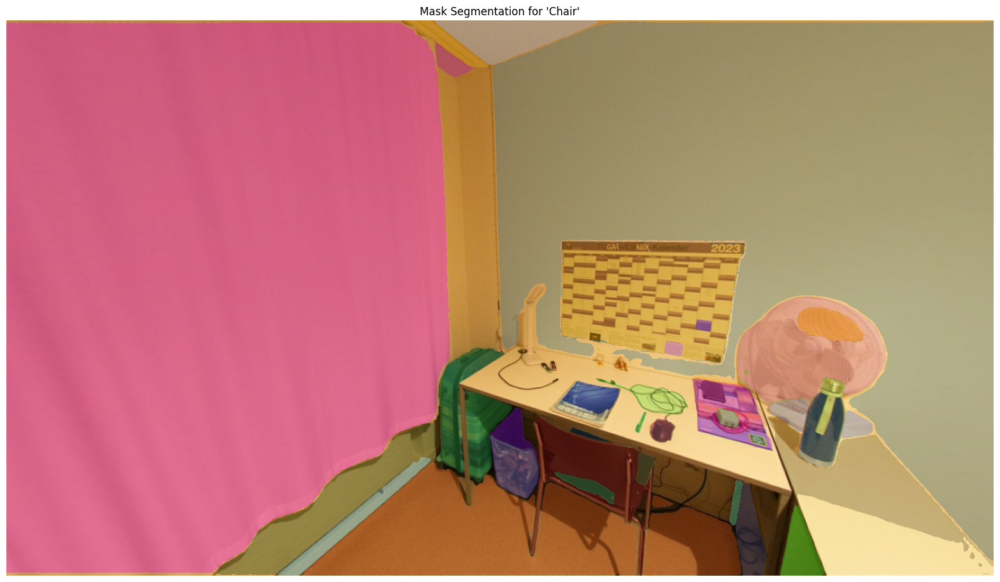

In [14]:
# Function to display masks on an image
def show_anns(anns, image):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=lambda x: x['area'], reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)
    img = np.ones((image.shape[0], image.shape[1], 4))
    img[:,:,3] = 0  # Initialize transparent layer
    for ann in sorted_anns:
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.35]])  # Add color with transparency
        img[m] = color_mask
    ax.imshow(img)

# Function to find the "chair" using CLIP
def find_chair_with_clip(image, masks):
    # Prepare text and image for CLIP
    text = clip.tokenize(["chair"]).to(device)
    image_input = preprocess(Image.fromarray(image)).unsqueeze(0).to(device)

    # Obtain embeddings from image and text
    with torch.no_grad():
        image_features = model.encode_image(image_input)
        text_features = model.encode_text(text)

    # Normalize embeddings
    image_features /= image_features.norm(dim=-1, keepdim=True)
    text_features /= text_features.norm(dim=-1, keepdim=True)

    # Calculate similarity
    similarity = (image_features @ text_features.T).squeeze(0)

    # Display results
    print(f"Similarity with 'chair': {similarity.item()}")

    # Display masks for segmentation of "chair"
    plt.figure(figsize=(20, 20))
    plt.imshow(image)
    show_anns(masks, image)
    plt.title("Mask Segmentation for 'Chair'")
    plt.axis('off')
    plt.show()

# Main function to process a single image
def process_image(image_path):
    print(f"Processing image: {image_path}")
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Generate masks for the image
    masks = mask_generator.generate(image_rgb)

    print(f"Found {len(masks)} masks.")

    # Save masks
    mask_save_path = os.path.splitext(image_path)[0] + "_masks.npy"
    np.save(mask_save_path, masks)

    # Use CLIP to find the object "chair"
    find_chair_with_clip(image_rgb, masks)

process_image(image_path)

In [15]:
import os
import numpy as np
import torch
import cv2
import matplotlib.pyplot as plt
from PIL import Image
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator
import clip

# Define paths
new_images_path = "/content/cutted_scannet_dataset/images"
masks_npy_path = "/content/cutted_scannet_dataset/masks_npy"
output_masks_path = "/content/cutted_scannet_dataset/output_masks"
os.makedirs(output_masks_path, exist_ok=True)

# Load CLIP model
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)

# Load SAM model
sam_checkpoint = "/content/sam_vit_h_4b8939.pth"
model_type = "vit_h"
sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

mask_generator = SamAutomaticMaskGenerator(sam)

# Function to compute IoU (Intersection over Union)
def compute_iou(pred_mask, true_mask):
    # Convert masks to binary
    pred_mask_bin = pred_mask.astype(np.uint8)
    true_mask_bin = (true_mask == 8).astype(np.uint8)  # Chair is labeled as 8

    # Calculate intersection and union
    intersection = np.sum(pred_mask_bin & true_mask_bin)
    union = np.sum(pred_mask_bin) + np.sum(true_mask_bin) - intersection

    # If there are no objects in both predicted and ground truth masks
    if union == 0:
        if np.sum(pred_mask_bin) == 0 and np.sum(true_mask_bin) == 0:
            return 1.0  # Perfect match scenario when there are no objects in both
        else:
            return 0  # Prevent division by zero if only one mask has no objects
    return intersection / union

# Function to display masks
def show_masks(image, true_mask, pred_mask):
    plt.figure(figsize=(20, 20))

    # Image with the true chair mask (only label 8 for chair)
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.imshow(true_mask, cmap='jet', alpha=0.5)
    plt.title("Real Mask (Chair)")
    plt.axis('off')

    # Image with the predicted chair mask
    plt.subplot(1, 2, 2)
    plt.imshow(image)
    plt.imshow(pred_mask, cmap='jet', alpha=0.5)
    plt.title("Predicted Mask (Chair)")
    plt.axis('off')

    plt.show()

# Function to get mask embedding using CLIP
def get_mask_embedding(image, mask):
    mask_image = np.zeros_like(image)
    mask_image[mask] = image[mask]
    mask_pil = Image.fromarray(mask_image)
    mask_input = preprocess(mask_pil).unsqueeze(0).to(device)

    with torch.no_grad():
        mask_embedding = model.encode_image(mask_input)

    return mask_embedding

# Function to find and merge "chair" masks based on cosine similarity
def find_chair_and_merge_masks(image, masks, prompt, threshold=0.3):
    # Tokenize the text "chair"
    text = clip.tokenize([prompt]).to(device)

    # Get the text embedding
    with torch.no_grad():
        text_features = model.encode_text(text)

    # Normalize text embeddings
    text_features /= text_features.norm(dim=-1, keepdim=True)

    selected_masks = []

    # Calculate cosine similarity for each mask
    for mask in masks:
        mask_data = mask["segmentation"]

        # Get mask embedding
        mask_embedding = get_mask_embedding(image, mask_data)

        # Normalize mask embedding
        mask_embedding /= mask_embedding.norm(dim=-1, keepdim=True)

        # Calculate cosine similarity between text and mask
        similarity = (mask_embedding @ text_features.T).squeeze(0).item()

        # If similarity is above the threshold, add the mask
        if similarity > threshold:
            selected_masks.append(mask_data)

    # Merge selected masks
    if selected_masks:
        final_mask = np.zeros_like(selected_masks[0], dtype=np.uint8)
        for mask in selected_masks:
            final_mask = np.maximum(final_mask, mask.astype(np.uint8))

        return final_mask
    else:
        return None

# Main function to process all images in the folder
def process_images(new_images_path, masks_npy_path, prompt):
    image_files = [f for f in os.listdir(new_images_path) if f.endswith(('.jpg', '.JPG'))]
    print(f"Found {len(image_files)} images.")

    ious = []

    for image_file in image_files:
        image_path = os.path.join(new_images_path, image_file)
        mask_path = os.path.join(masks_npy_path, f"{os.path.splitext(image_file)[0]}.npy")

        print(f"Processing image: {image_file}")

        # Read image
        image = cv2.imread(image_path)
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Generate masks for the image
        masks = mask_generator.generate(image_rgb)

        # Load true mask
        true_mask = np.load(mask_path)

        # Find and merge "chair" masks
        final_mask = find_chair_and_merge_masks(image_rgb, masks, prompt)

        # Display results
        print(f"Real mask for {image_file}:")
        real_chair_mask = (true_mask == 8).astype(np.uint8)  # Chair in true mask

        if final_mask is not None:
            # If chair mask is found, compute IoU
            iou = compute_iou(final_mask, true_mask)
            ious.append(iou)

            print(f"IoU for {image_file}: {iou:.4f}")
        else:
            print(f"No suitable chair masks found for {image_file}")
            if np.sum((true_mask == 8).astype(np.uint8)) == 0:
              iou = 1
            else:
              iou = 0
            ious.append(iou)
        print('Current IOU: ', iou)

        # Display the true chair mask and predicted chair mask only
        show_masks(image_rgb, real_chair_mask, final_mask if final_mask is not None else np.zeros_like(image_rgb))

    # Compute average IoU across all images
    if ious:
        mean_iou = np.mean(ious)
        print(f"\n\n\nRESULT:\n Average IoU across all images: {mean_iou:.4f}")
    else:
        print("No suitable chair masks were found.")

Found 35 images.
Processing image: DSC06188.JPG
Real mask for DSC06188.JPG:
No suitable chair masks found for DSC06188.JPG
Current IOU:  1


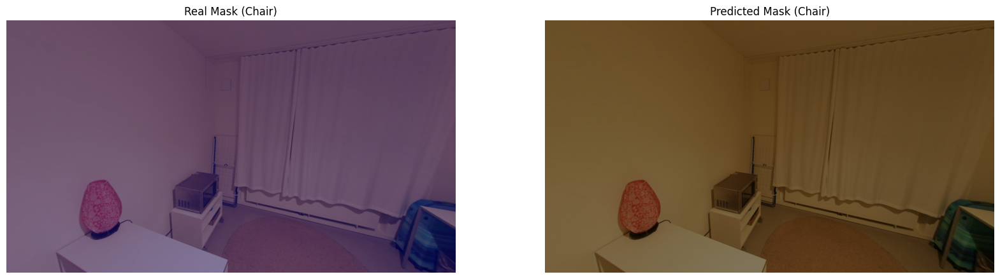

Processing image: DSC06176.JPG
Real mask for DSC06176.JPG:
No suitable chair masks found for DSC06176.JPG
Current IOU:  1


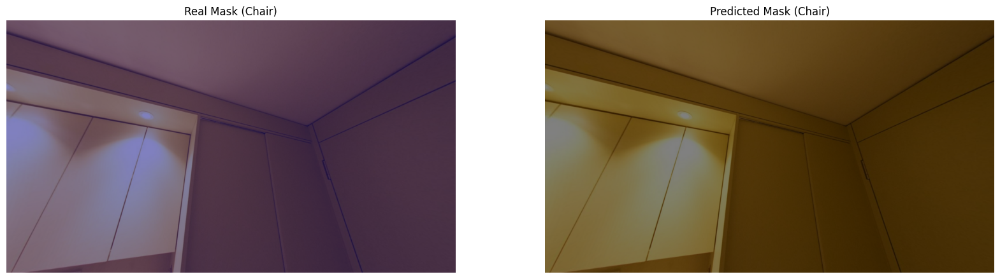

Processing image: DSC06117.JPG
Real mask for DSC06117.JPG:
No suitable chair masks found for DSC06117.JPG
Current IOU:  1


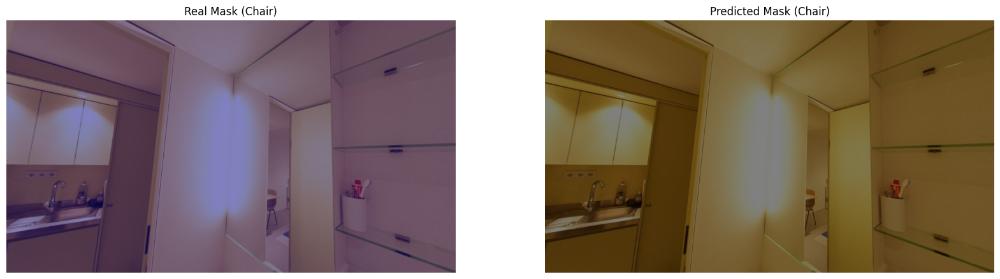

Processing image: DSC06037.JPG
Real mask for DSC06037.JPG:
No suitable chair masks found for DSC06037.JPG
Current IOU:  0


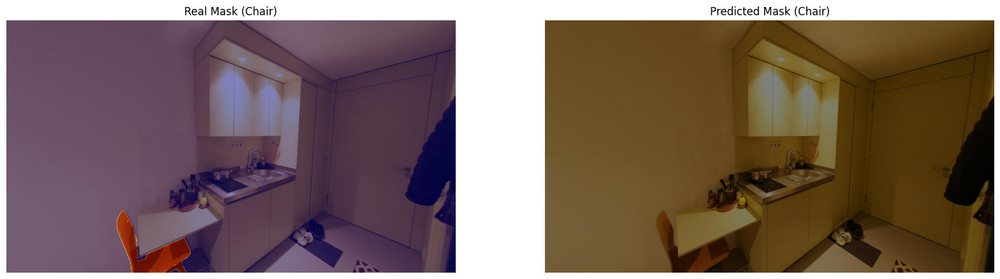

Processing image: DSC05977.JPG
Real mask for DSC05977.JPG:
No suitable chair masks found for DSC05977.JPG
Current IOU:  0


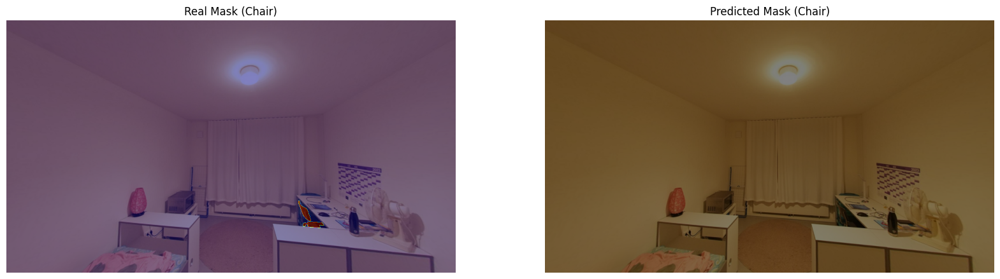

Processing image: DSC06007.JPG
Real mask for DSC06007.JPG:
No suitable chair masks found for DSC06007.JPG
Current IOU:  1


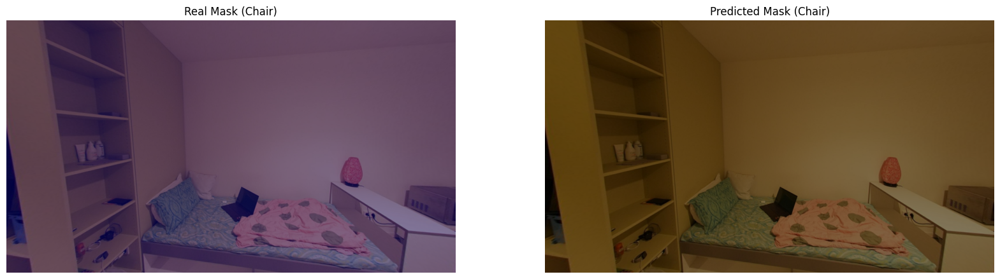

Processing image: DSC06156.JPG
Real mask for DSC06156.JPG:
No suitable chair masks found for DSC06156.JPG
Current IOU:  1


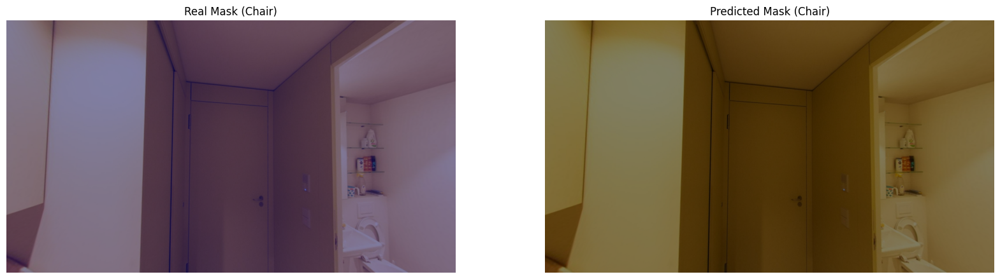

Processing image: DSC06047.JPG
Real mask for DSC06047.JPG:
IoU for DSC06047.JPG: 0.6748
Current IOU:  0.67479620915899


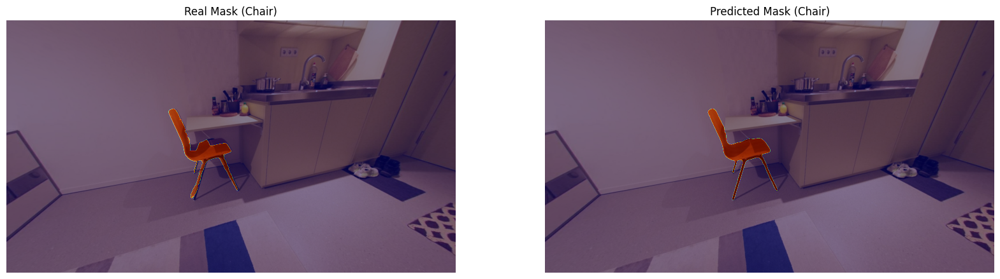

Processing image: DSC05837.JPG
Real mask for DSC05837.JPG:
No suitable chair masks found for DSC05837.JPG
Current IOU:  1


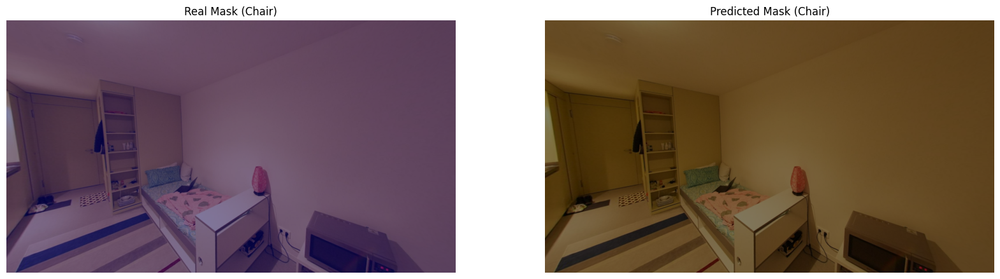

Processing image: DSC05887.JPG
Real mask for DSC05887.JPG:
IoU for DSC05887.JPG: 0.8683
Current IOU:  0.8682851239669421


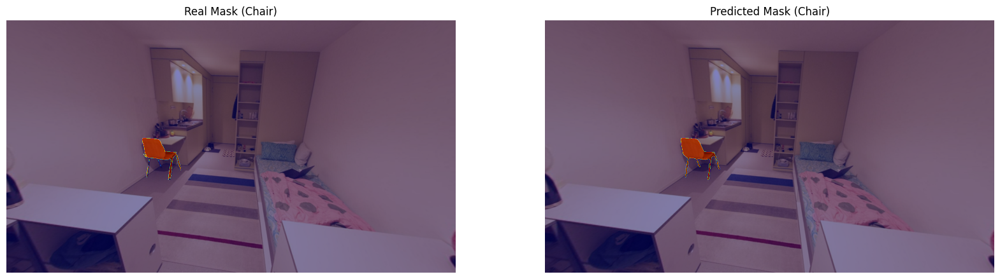

Processing image: DSC06077.JPG
Real mask for DSC06077.JPG:
No suitable chair masks found for DSC06077.JPG
Current IOU:  1


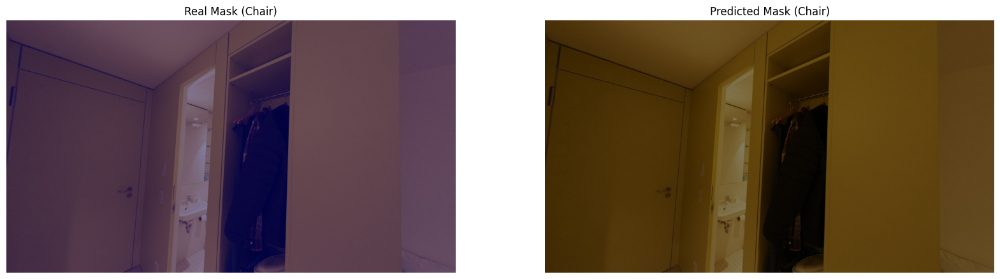

Processing image: DSC06067.JPG
Real mask for DSC06067.JPG:
No suitable chair masks found for DSC06067.JPG
Current IOU:  1


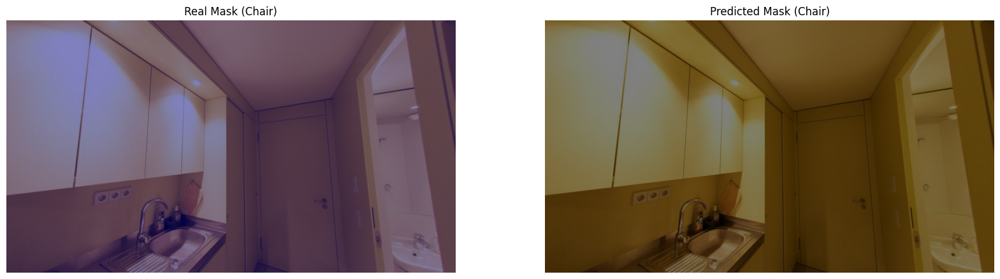

Processing image: DSC05957.JPG
Real mask for DSC05957.JPG:
No suitable chair masks found for DSC05957.JPG
Current IOU:  0


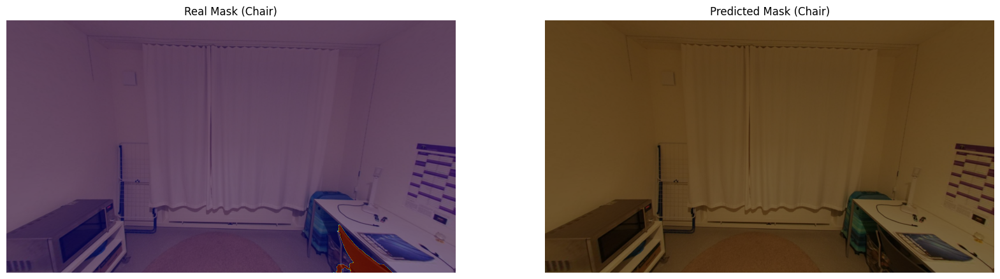

Processing image: DSC06017.JPG
Real mask for DSC06017.JPG:
No suitable chair masks found for DSC06017.JPG
Current IOU:  1


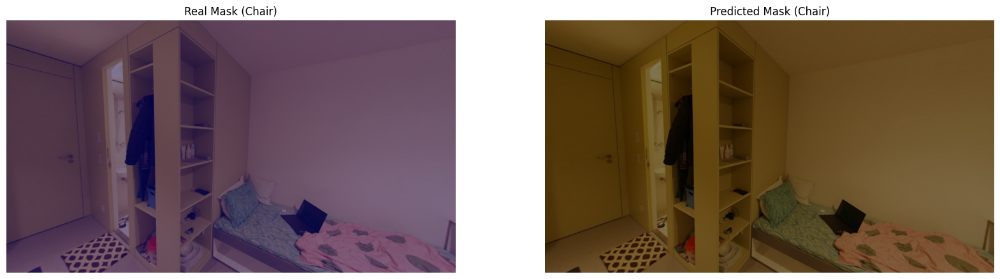

Processing image: DSC05937.JPG
Real mask for DSC05937.JPG:
IoU for DSC05937.JPG: 0.6593
Current IOU:  0.6592612784516833


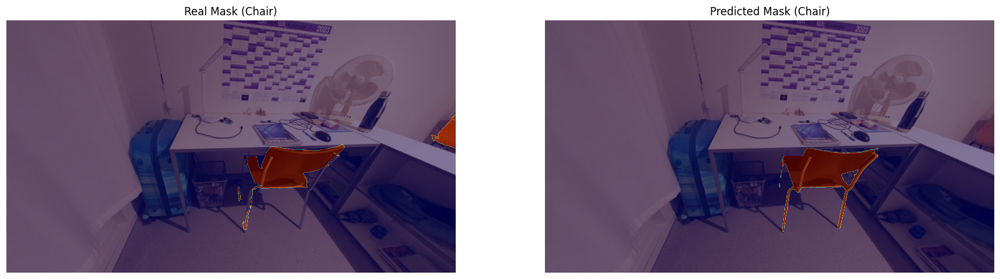

Processing image: DSC05947.JPG
Real mask for DSC05947.JPG:
IoU for DSC05947.JPG: 0.7386
Current IOU:  0.7385759222190449


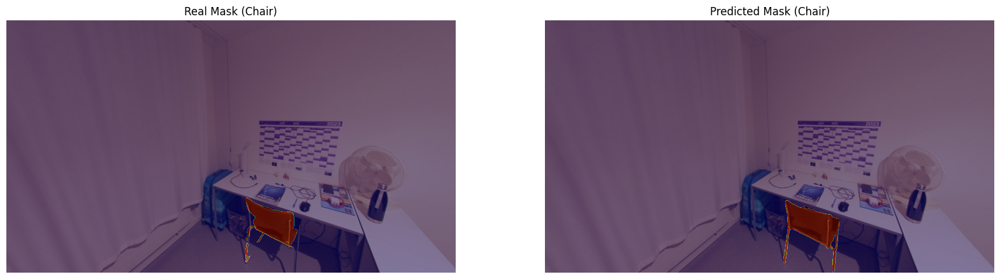

Processing image: DSC06097.JPG
Real mask for DSC06097.JPG:
No suitable chair masks found for DSC06097.JPG
Current IOU:  1


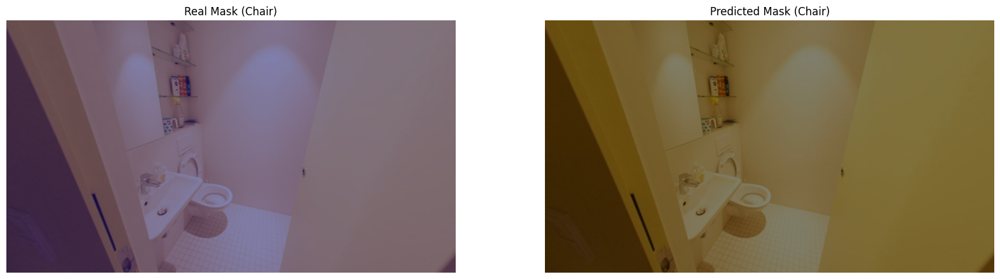

Processing image: DSC06127.JPG
Real mask for DSC06127.JPG:
No suitable chair masks found for DSC06127.JPG
Current IOU:  1


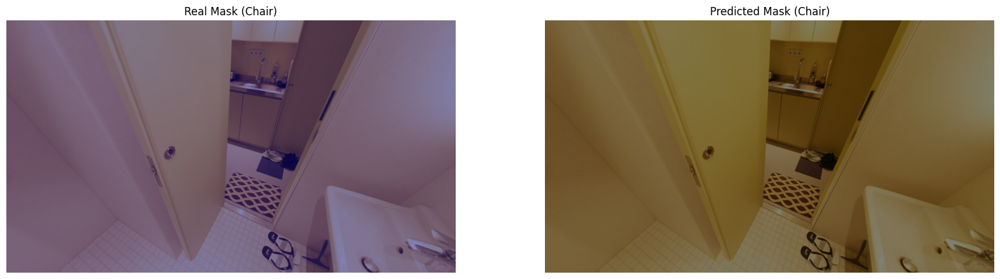

Processing image: DSC05867.JPG
Real mask for DSC05867.JPG:
No suitable chair masks found for DSC05867.JPG
Current IOU:  1


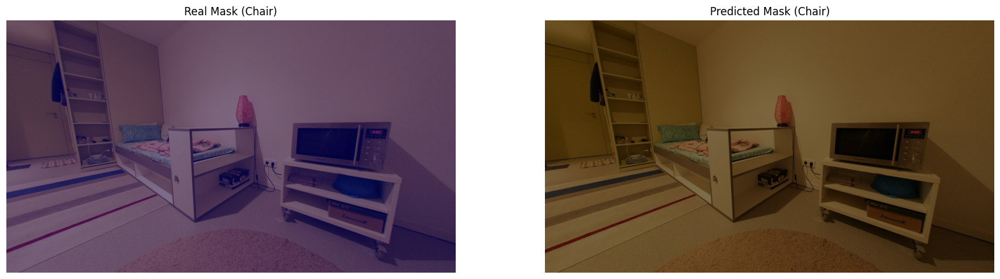

Processing image: DSC05847.JPG
Real mask for DSC05847.JPG:
IoU for DSC05847.JPG: 0.8740
Current IOU:  0.8740270971461517


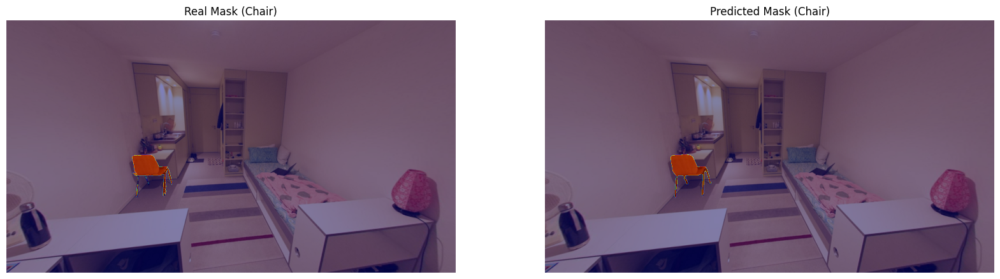

Processing image: DSC05827.JPG
Real mask for DSC05827.JPG:
No suitable chair masks found for DSC05827.JPG
Current IOU:  1


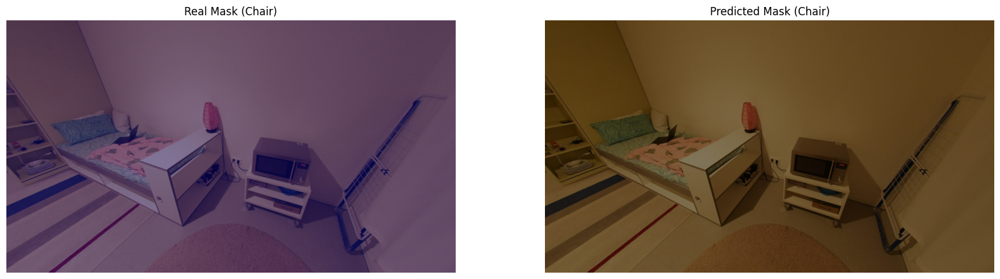

Processing image: DSC05967.JPG
Real mask for DSC05967.JPG:
No suitable chair masks found for DSC05967.JPG
Current IOU:  1


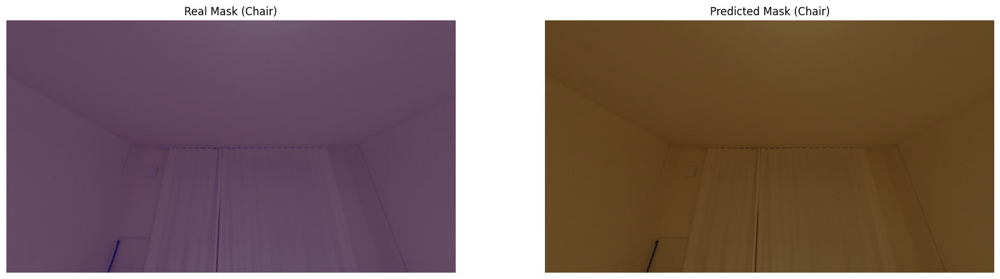

Processing image: DSC05997.JPG
Real mask for DSC05997.JPG:
No suitable chair masks found for DSC05997.JPG
Current IOU:  0


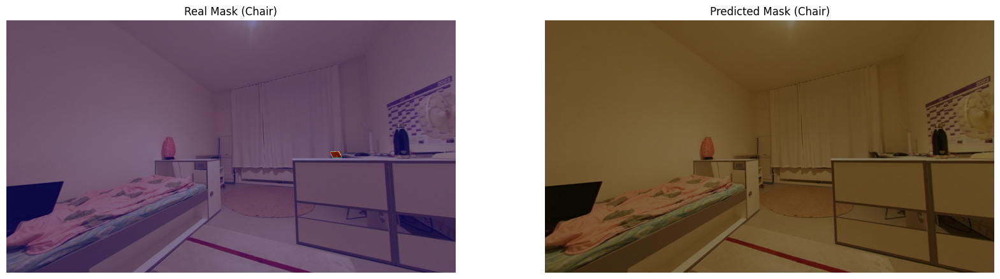

Processing image: DSC05897.JPG
Real mask for DSC05897.JPG:
IoU for DSC05897.JPG: 0.8243
Current IOU:  0.8242813168466635


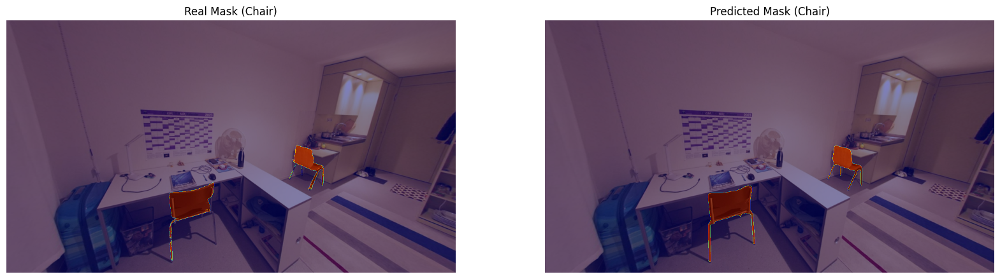

Processing image: DSC05917.JPG
Real mask for DSC05917.JPG:
No suitable chair masks found for DSC05917.JPG
Current IOU:  0


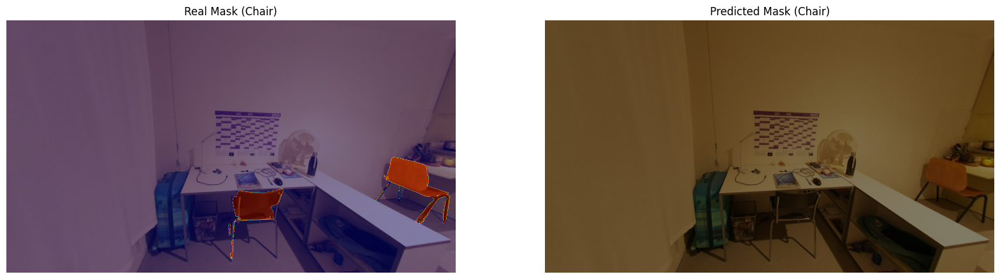

Processing image: DSC05907.JPG
Real mask for DSC05907.JPG:
IoU for DSC05907.JPG: 0.4356
Current IOU:  0.4355873015873016


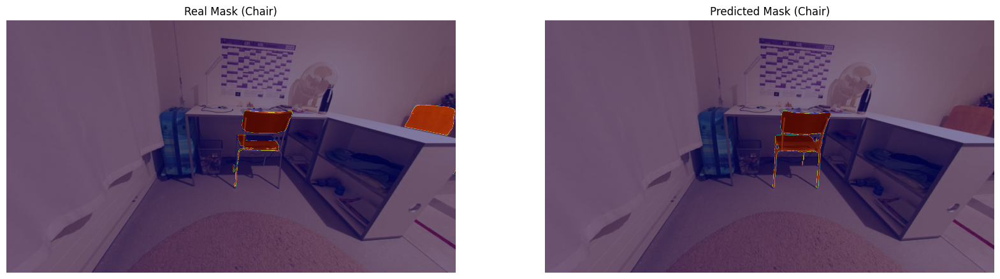

Processing image: DSC05927.JPG
Real mask for DSC05927.JPG:
No suitable chair masks found for DSC05927.JPG
Current IOU:  0


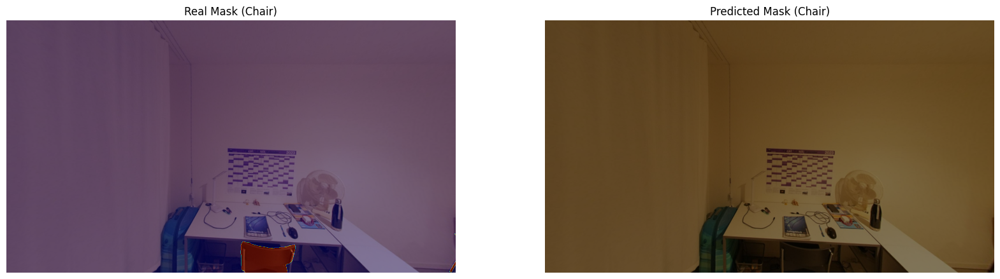

Processing image: DSC06107.JPG
Real mask for DSC06107.JPG:
No suitable chair masks found for DSC06107.JPG
Current IOU:  1


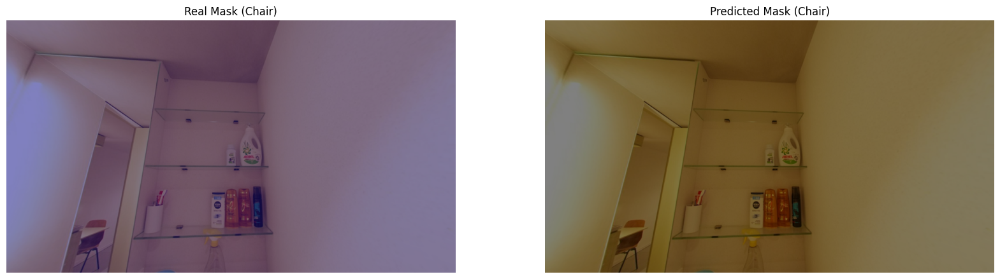

Processing image: DSC06166.JPG
Real mask for DSC06166.JPG:
No suitable chair masks found for DSC06166.JPG
Current IOU:  1


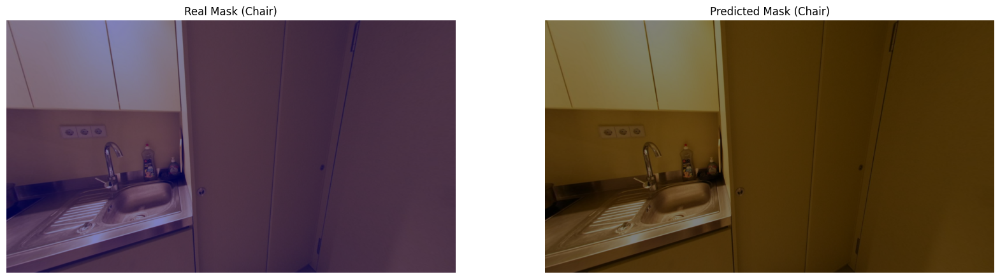

Processing image: DSC05857.JPG
Real mask for DSC05857.JPG:
No suitable chair masks found for DSC05857.JPG
Current IOU:  0


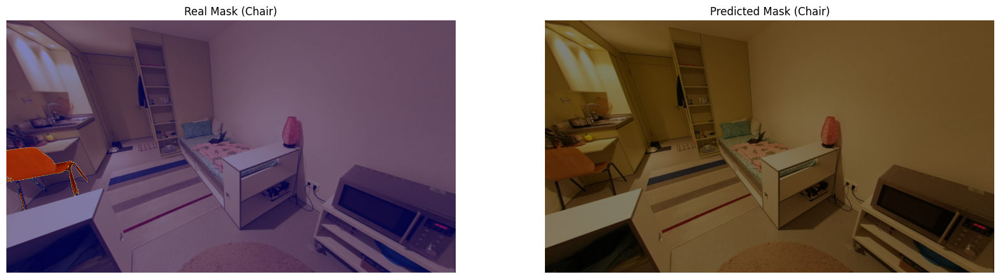

Processing image: DSC05987.JPG
Real mask for DSC05987.JPG:
No suitable chair masks found for DSC05987.JPG
Current IOU:  0


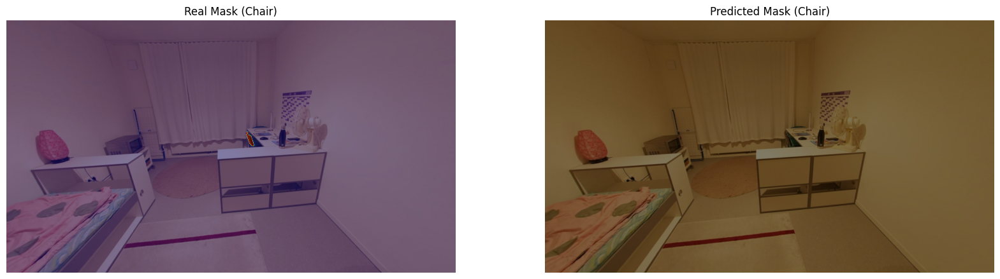

Processing image: DSC06057.JPG
Real mask for DSC06057.JPG:
No suitable chair masks found for DSC06057.JPG
Current IOU:  1


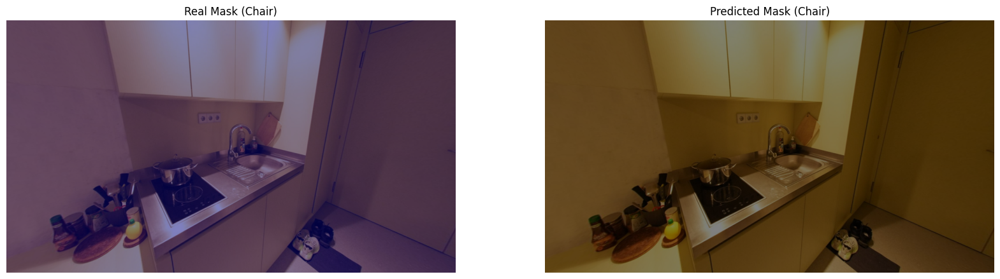

Processing image: DSC05877.JPG
Real mask for DSC05877.JPG:
No suitable chair masks found for DSC05877.JPG
Current IOU:  1


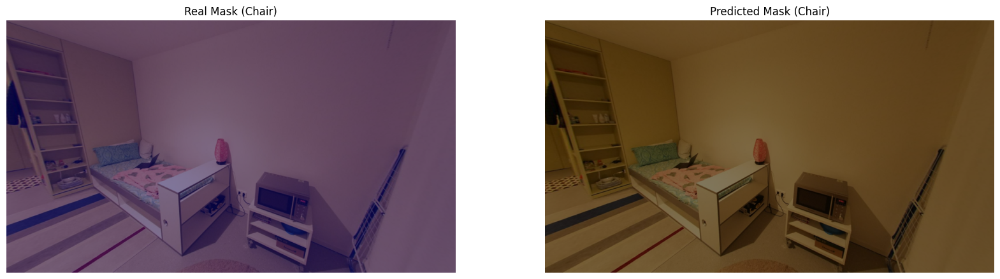

Processing image: DSC06027.JPG
Real mask for DSC06027.JPG:
No suitable chair masks found for DSC06027.JPG
Current IOU:  1


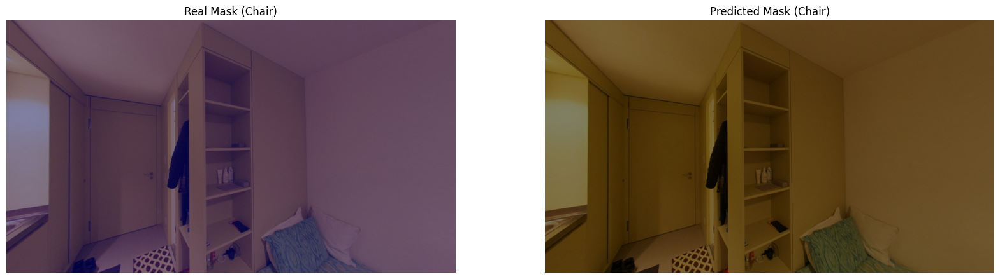

Processing image: DSC06087.JPG
Real mask for DSC06087.JPG:
No suitable chair masks found for DSC06087.JPG
Current IOU:  1


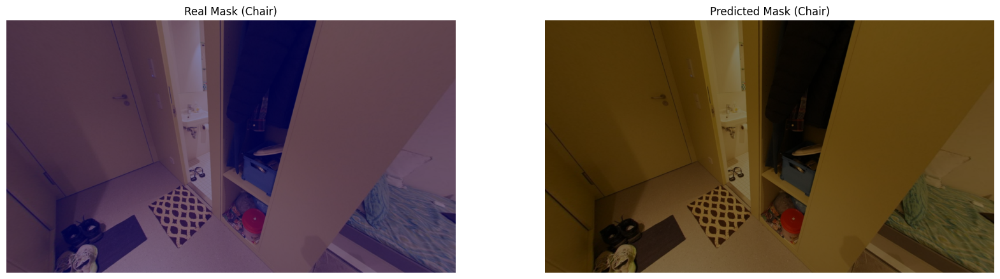




RESULT:
 Average IoU across all images: 0.7164


In [16]:
process_images(new_images_path, masks_npy_path, prompt='chair')